# Imports

In [1]:
from os import walk
from os.path import join
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import nltk
from nltk.stem import PorterStemmer
from nltk.stem import SnowballStemmer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

from bs4 import BeautifulSoup

from wordcloud import WordCloud

from PIL import Image

from sklearn.model_selection import train_test_split

%matplotlib inline

# Constants

In [2]:
EXAMPLE_TEXT = 'SpamData/SpamData/01_Processing/practice_email.txt'
NONSPAM_1 = 'SpamData/SpamData/01_Processing/spam_assassin_corpus/easy_ham_1'
NONSPAM_2 = 'SpamData/SpamData/01_Processing/spam_assassin_corpus/easy_ham_2'
SPAM_1 = 'SpamData/SpamData/01_Processing/spam_assassin_corpus/spam_1'
SPAM_2 = 'SpamData/SpamData/01_Processing/spam_assassin_corpus/spam_2'

EMAIL_DATA = 'SpamData/SpamData/01_Processing/email_data.json'
WORD_FILE = 'SpamData/SpamData/01_Processing/word-vocabulary.csv'

WHALE_IM = 'SpamData/SpamData/01_Processing/wordcloud_resources/whale-icon.png'
THUMB_UP = 'SpamData/SpamData/01_Processing/wordcloud_resources/thumbs-up.png'
THUMB_DOWN = 'SpamData/SpamData/01_Processing/wordcloud_resources/thumbs-down.png'

VOCAB_SIZE = 2500
SPAM_CAT = 1
NONSPAM_CAT = 0

# Read file

In [3]:
stream = open(EXAMPLE_TEXT,encoding='latin-1' )
body = []
is_body=False

for line in stream:
    if(is_body):
        body.append(line)
    elif(line=='\n'):
        is_body=True
stream.close()

email_body = '\n'.join(body)
print(email_body)
print(body)




Dear Mr Still



Good tidings to you and all your staff for the festive season ahead (Christmas).

Now to the crux of the matter-in-hand: I am a fully qualified Santa Claus and am wondering whether you might consider me to run my own "Santa's Grotto" in your store.

But WAIT! You're probably thinking: "What makes him so special?"

Well, first of all, I have made several changes to the characterisation of Father Christmas. Rather than greeting the children with shouts of "Ho, ho, ho!" I prefer to whisper the phrase "Dependence is not unfathomable in this cruel world we live in". In addition, my gifts are ALL hand-made, ranging from felt hoops to vanilla-pod holders.

You will note also, from the enclosed sketch, that I have radically redesigned Santa's outfit and have renamed my character "Lord Buckles". Would you be interested in employing me? I promise NEVER to let you down.

I look forward to hearing from you.



Best wishes

Robin Cooper

[Excerpt from the book: The Timewaster Let

# Extract emails body using Generator function

In [4]:
def email_body_generator(path):
    for root,dirnames,filenames in walk(path):
        for file_name in filenames:
            file_path = join(root,file_name)
            stream = open(file_path,encoding='latin-1' )
            body = []
            is_body=False

            for line in stream:
                if(is_body):
                    body.append(line)
                elif(line=='\n'):
                    is_body=True
            stream.close()
            email_body = '\n'.join(body)
            yield file_name,email_body
            

In [5]:
# generator function must be called repeatedly
def dataframe_from_dict(path,classification):
    rows=[]
    row_names=[]
    
    for file_name1,email_body in email_body_generator(path):
        rows.append({'MESSAGE':email_body,'CATEGORY':classification})
        row_names.append(file_name1)
        
    return pd.DataFrame(rows,index=row_names)

In [6]:
spam_emails = dataframe_from_dict(SPAM_1,SPAM_CAT)
spam_emails = spam_emails.append(dataframe_from_dict(SPAM_2,SPAM_CAT))

#s = dataframe_from_dict(SPAM_1,SPAM_CAT).append(dataframe_from_dict(SPAM_2,SPAM_CAT))
print(spam_emails.head(3))
print(spam_emails.shape)

                                                                                  MESSAGE  \
00001.7848dde101aa985090474a91ec93fcf0  <!DOCTYPE HTML PUBLIC "-//W3C//DTD HTML 4.0 Tr...   
00002.d94f1b97e48ed3b553b3508d116e6a09  1) Fight The Risk of Cancer!\n\nhttp://www.adc...   
00003.2ee33bc6eacdb11f38d052c44819ba6c  1) Fight The Risk of Cancer!\n\nhttp://www.adc...   

                                        CATEGORY  
00001.7848dde101aa985090474a91ec93fcf0         1  
00002.d94f1b97e48ed3b553b3508d116e6a09         1  
00003.2ee33bc6eacdb11f38d052c44819ba6c         1  
(1898, 2)


In [7]:
nonspam_emails = dataframe_from_dict(NONSPAM_1,NONSPAM_CAT)
nonspam_emails = nonspam_emails.append(dataframe_from_dict(NONSPAM_2,NONSPAM_CAT))


In [8]:
emails = pd.concat([spam_emails,nonspam_emails])
# print(emails)

In [9]:
# check and show each message null/none/NA or not. if so return true
emails.MESSAGE.isnull().values
# return true if any values of series is true. one true element is enough. if all false,return false
emails.MESSAGE.isnull().values.any()


False

In [10]:
#emails.MESSAGE === emails['MESSAGE']
#check if there is zero len emails
emails.MESSAGE.str.len()
emails["MESSAGE"].str.len()

00001.7848dde101aa985090474a91ec93fcf0    3966
00002.d94f1b97e48ed3b553b3508d116e6a09     820
00003.2ee33bc6eacdb11f38d052c44819ba6c     669
00004.eac8de8d759b7e74154f142194282724    3004
00005.57696a39d7d84318ce497886896bf90d     687
                                          ... 
01396.61983fbe6ec43f55fd44e30fce24ffa6    1221
01397.9f9ef4c2a8dc012d80f2ce2d3473d3b7     620
01398.169b51731fe569f42169ae8f948ec676    3244
01399.ca6b00b7b341bbde9a9ea3dd6a7bf896     804
01400.f897f0931e461e7b2e964d28e927c35e    4143
Name: MESSAGE, Length: 5799, dtype: int64

In [11]:
# check each emails body is empty or not. if len=0 provide series of result
emails.MESSAGE.str.len()==0
# (emails.MESSAGE.str.len()==0).any()  # return true if any element is true
# (emails.MESSAGE.str.len()==0).sum()  # return Number of elemens that is true

00001.7848dde101aa985090474a91ec93fcf0    False
00002.d94f1b97e48ed3b553b3508d116e6a09    False
00003.2ee33bc6eacdb11f38d052c44819ba6c    False
00004.eac8de8d759b7e74154f142194282724    False
00005.57696a39d7d84318ce497886896bf90d    False
                                          ...  
01396.61983fbe6ec43f55fd44e30fce24ffa6    False
01397.9f9ef4c2a8dc012d80f2ce2d3473d3b7    False
01398.169b51731fe569f42169ae8f948ec676    False
01399.ca6b00b7b341bbde9a9ea3dd6a7bf896    False
01400.f897f0931e461e7b2e964d28e927c35e    False
Name: MESSAGE, Length: 5799, dtype: bool

In [12]:
emails[emails.MESSAGE.str.len()==0]
# [emails.MESSAGE.str.len()==0 is a series

,MESSAGE,CATEGORY
cmds,,1
cmds,,1
cmds,,0


In [13]:
emails[emails.MESSAGE.str.len()==0].index
# (emails[emails.MESSAGE.str.len()==0].index)[1]

Index(['cmds', 'cmds', 'cmds'], dtype='object')

In [14]:
emails.index.get_loc('cmds')

array([False, False, False, ..., False, False, False])

In [15]:
# Delete those empty values
emails.drop(['cmds'] , inplace=True) # emails = emails.drop(['cmds'] , inplace=True) are same

In [16]:
emails[emails.MESSAGE.str.len()==0].index

Index([], dtype='object')

In [17]:
emails

,MESSAGE,CATEGORY
00001.7848dde101aa985090474a91ec93fcf0,"<!DOCTYPE HTML PUBLIC ""-//W3C//DTD HTML 4.0 Tr...",1
00002.d94f1b97e48ed3b553b3508d116e6a09,1) Fight The Risk of Cancer!\n\nhttp://www.adc...,1
00003.2ee33bc6eacdb11f38d052c44819ba6c,1) Fight The Risk of Cancer!\n\nhttp://www.adc...,1
00004.eac8de8d759b7e74154f142194282724,##############################################...,1
00005.57696a39d7d84318ce497886896bf90d,I thought you might like these:\n\n1) Slim Dow...,1
...,...,...
01396.61983fbe6ec43f55fd44e30fce24ffa6,http://news.bbc.co.uk/1/hi/england/2515127.stm...,0
01397.9f9ef4c2a8dc012d80f2ce2d3473d3b7,"> >-- be careful when using this one.) Also, t...",0
01398.169b51731fe569f42169ae8f948ec676,">>>>> ""SM"" == Skip Montanaro <skip@pobox.com> ...",0
01399.ca6b00b7b341bbde9a9ea3dd6a7bf896,"So then, ""Mark Hammond"" <mhammond@skippinet.co...",0


In [18]:
#make index readable
doc_ids = range(0,len(emails))
emails['DOC_ID'] = doc_ids
emails

,MESSAGE,CATEGORY,DOC_ID
00001.7848dde101aa985090474a91ec93fcf0,"<!DOCTYPE HTML PUBLIC ""-//W3C//DTD HTML 4.0 Tr...",1,0
00002.d94f1b97e48ed3b553b3508d116e6a09,1) Fight The Risk of Cancer!\n\nhttp://www.adc...,1,1
00003.2ee33bc6eacdb11f38d052c44819ba6c,1) Fight The Risk of Cancer!\n\nhttp://www.adc...,1,2
00004.eac8de8d759b7e74154f142194282724,##############################################...,1,3
00005.57696a39d7d84318ce497886896bf90d,I thought you might like these:\n\n1) Slim Dow...,1,4
...,...,...,...
01396.61983fbe6ec43f55fd44e30fce24ffa6,http://news.bbc.co.uk/1/hi/england/2515127.stm...,0,5791
01397.9f9ef4c2a8dc012d80f2ce2d3473d3b7,"> >-- be careful when using this one.) Also, t...",0,5792
01398.169b51731fe569f42169ae8f948ec676,">>>>> ""SM"" == Skip Montanaro <skip@pobox.com> ...",0,5793
01399.ca6b00b7b341bbde9a9ea3dd6a7bf896,"So then, ""Mark Hammond"" <mhammond@skippinet.co...",0,5794


In [19]:
emails['FILE_NAME'] = emails.index
emails = emails.set_index('DOC_ID')
emails

,MESSAGE,CATEGORY,FILE_NAME
DOC_ID,,,
0,"<!DOCTYPE HTML PUBLIC ""-//W3C//DTD HTML 4.0 Tr...",1,00001.7848dde101aa985090474a91ec93fcf0
1,1) Fight The Risk of Cancer!\n\nhttp://www.adc...,1,00002.d94f1b97e48ed3b553b3508d116e6a09
2,1) Fight The Risk of Cancer!\n\nhttp://www.adc...,1,00003.2ee33bc6eacdb11f38d052c44819ba6c
3,##############################################...,1,00004.eac8de8d759b7e74154f142194282724
4,I thought you might like these:\n\n1) Slim Dow...,1,00005.57696a39d7d84318ce497886896bf90d
...,...,...,...
5791,http://news.bbc.co.uk/1/hi/england/2515127.stm...,0,01396.61983fbe6ec43f55fd44e30fce24ffa6
5792,"> >-- be careful when using this one.) Also, t...",0,01397.9f9ef4c2a8dc012d80f2ce2d3473d3b7
5793,">>>>> ""SM"" == Skip Montanaro <skip@pobox.com> ...",0,01398.169b51731fe569f42169ae8f948ec676


In [20]:
# Save cleaned data to local machine.
# pandas datafarame can be saved as a json file.
emails.to_json(EMAIL_DATA)

# Visualize data

In [21]:
emails.CATEGORY.value_counts()

0    3900
1    1896
Name: CATEGORY, dtype: int64

In [22]:
num_of_spam = emails.CATEGORY.value_counts()[1]
num_of_ham= emails.CATEGORY.value_counts()[0]

cat_names = ['Spam','Nonspam']
sizes = [num_of_spam,num_of_ham]

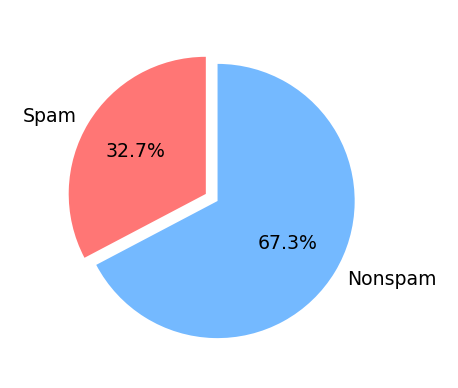

In [23]:
plt.figure(figsize=(2,2),dpi=227)
plt.pie(sizes,labels=cat_names, textprops = {'fontsize':6}, startangle=90, autopct='%1.1f%%',
       colors=['#ff7675','#74b9ff'], explode=[0,0.1])
plt.show()

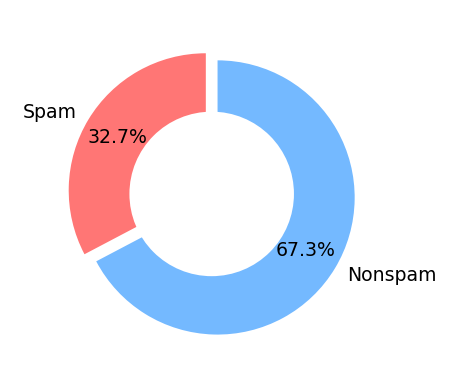

In [24]:
plt.figure(figsize=(2,2),dpi=227)
plt.pie(sizes,labels=cat_names, textprops = {'fontsize':6}, startangle=90, autopct='%1.1f%%',
       colors=['#ff7675','#74b9ff'],pctdistance=0.75, explode=[0.05,0.05])

circular_c = plt.Circle([0,0],radius=0.6, fc='white')
plt.gca().add_artist(circular_c)

plt.show()

# ```****Natural Language Processing****```

## Text pre-process

In [25]:
#convert to lower case
words = 'All are Good'
lower_word =words.lower()

## Download NLTK resources(Tokenizer & stopwords)

In [26]:
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\KAVISHKA\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\KAVISHKA\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [27]:
nltk.download('shakespeare')
nltk.download('gutenberg')

[nltk_data] Downloading package shakespeare to
[nltk_data]     C:\Users\KAVISHKA\AppData\Roaming\nltk_data...
[nltk_data]   Package shakespeare is already up-to-date!
[nltk_data] Downloading package gutenberg to
[nltk_data]     C:\Users\KAVISHKA\AppData\Roaming\nltk_data...
[nltk_data]   Package gutenberg is already up-to-date!


True

## Tokenizing

In [28]:
word = 'All ,are doing Good JObs.'
word_tokenize(word.lower())

['all', ',', 'are', 'doing', 'good', 'jobs', '.']

## remove stop words

In [29]:
stopword_set = set(stopwords.words('english'))

In [30]:
filtered_word=[]
inp_word = word_tokenize(word.lower())

for w in  inp_word:
    if w not in stopword_set :
        filtered_word.append(w)
        
filtered_word

[',', 'good', 'jobs', '.']

## Remove punctuation and stemm

In [31]:
word = 'All ,are doing Good Jobs. ?? we can do more things in a good way'
word_tokenize(word.lower())

filtered_word2=[]
inp_word = word_tokenize(word.lower())
stemmer = SnowballStemmer('english')  # fishing,fish,fished,fishes=> only take fish.

for w in  inp_word:
    if (w not in stopword_set and w.isalpha()):
        stemmed_word = stemmer.stem(w)
        filtered_word2.append(stemmed_word)
        
filtered_word2

['good', 'job', 'thing', 'good', 'way']

## Remove HTML tags

In [32]:
soup = BeautifulSoup(emails.at[125, 'MESSAGE'],'html.parser')
#print(soup.prettify)
print(soup.get_text())

This is a multipart message in MIME format.



--9EE6957817154900AA7494F2E1F329BE

Content-Type: text/html;

	charset="iso-8859-1"

Content-Transfer-Encoding: quoted-printable



w3498 98sd0f89 498w90



Lose weight while building lean muscle mass  and reversing the

ravages of aging all at once












Human

        Growth Hormone Therapy
Lose weight while

        building lean muscle mass

         and reversing the ravages of aging all at once.



        Remarkable discoveries about Human Growth Hormones (HGH) 

        are changing the way we think about aging and weight loss.<=

/p>

          



• Lose Weight

                • Build Muscle Tone

                • Reverse Aging

                • Increased Libido

                • Duration Of Penile

                  Erection


• Healthier Bones

                • Improved Memory

                • Improved skin

                • New Hair Growth

                • Wrinkle

                  Disappearance

             

In [33]:
def clean_email_body(message, stemmer=PorterStemmer(), stopword_set=set(stopwords.words('english'))):
    
    soup = BeautifulSoup(message,'html.parser')
    
    filtered_word=[]
    inp_word = word_tokenize(soup.get_text().lower())
    
    for w in  inp_word:
        if (w not in stopword_set and w.isalpha()):
            stemmed_word = stemmer.stem(w)
            filtered_word.append(stemmed_word)
    return filtered_word

In [34]:
print(clean_email_body(emails.at[125, 'MESSAGE']))

['multipart', 'messag', 'mime', 'format', 'lose', 'weight', 'build', 'lean', 'muscl', 'mass', 'revers', 'ravag', 'age', 'human', 'growth', 'hormon', 'therapi', 'lose', 'weight', 'build', 'lean', 'muscl', 'mass', 'revers', 'ravag', 'age', 'remark', 'discoveri', 'human', 'growth', 'hormon', 'hgh', 'chang', 'way', 'think', 'age', 'weight', 'lose', 'weight', 'build', 'muscl', 'tone', 'revers', 'age', 'increas', 'libido', 'durat', 'penil', 'erect', 'healthier', 'bone', 'improv', 'memori', 'improv', 'skin', 'new', 'hair', 'growth', 'wrinkl', 'disappear', 'visit', 'web', 'site', 'learn', 'fact', 'click', 'strongli', 'send', 'unsolicit', 'email', 'h', 'receiv', 'special', 'mail', 'opt', 'one', 'affili', 'site', 'request', 'notifi', 'special', 'offer', 'retain', 'servic', 'independ', 'parti', 'manag', 'list', 'remov', 'servic', 'wish', 'receiv', 'mail', 'eas', 'click', 'remov', 'list', 'pleas', 'accept', 'apolog', 'sent', 'email', 'error', 'honor', 'remov', 'request', 'unsubscrib', 'click', 'in

# Apply clean, tokenize to all data

## Slicing dataframe, series and create subsets

In [35]:
emails.iat[1,0]  # 1st row, 0th column

"1) Fight The Risk of Cancer!\n\nhttp://www.adclick.ws/p.cfm?o=315&s=pk007\n\n\n\n2) Slim Down - Guaranteed to lose 10-12 lbs in 30 days\n\nhttp://www.adclick.ws/p.cfm?o=249&s=pk007\n\n\n\n3) Get the Child Support You Deserve - Free Legal Advice\n\nhttp://www.adclick.ws/p.cfm?o=245&s=pk002\n\n\n\n4) Join the Web's Fastest Growing Singles Community\n\nhttp://www.adclick.ws/p.cfm?o=259&s=pk007\n\n\n\n5) Start Your Private Photo Album Online!\n\nhttp://www.adclick.ws/p.cfm?o=283&s=pk007\n\n\n\nHave a Wonderful Day,\n\nOffer Manager\n\nPrizeMama\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\nIf you wish to leave this list please use the link below.\n\nhttp://www.qves.com/trim/?ilug@linux.ie%7C17%7C114258\n\n\n\n\n\n-- \n\nIrish Linux Users' Group: ilug@linux.ie\n\nhttp://www.linux.ie/mailman/listinfo/ilug for (un)subscription information.\n\nList maintainer: listmaster@linux.ie\n\n\n"

In [36]:
# select range
emails.iloc[0:3]  

,MESSAGE,CATEGORY,FILE_NAME
DOC_ID,,,
0,"<!DOCTYPE HTML PUBLIC ""-//W3C//DTD HTML 4.0 Tr...",1,00001.7848dde101aa985090474a91ec93fcf0
1,1) Fight The Risk of Cancer!\n\nhttp://www.adc...,1,00002.d94f1b97e48ed3b553b3508d116e6a09
2,1) Fight The Risk of Cancer!\n\nhttp://www.adc...,1,00003.2ee33bc6eacdb11f38d052c44819ba6c


In [37]:
emails.MESSAGE.iloc[0:3]

DOC_ID
0    <!DOCTYPE HTML PUBLIC "-//W3C//DTD HTML 4.0 Tr...
1    1) Fight The Risk of Cancer!\n\nhttp://www.adc...
2    1) Fight The Risk of Cancer!\n\nhttp://www.adc...
Name: MESSAGE, dtype: object

In [38]:
# apply function to values in DF
values = emails.MESSAGE.iloc[0:3]
nested_list = values.apply(clean_email_body)
nested_list
# this return series. List consist of lists

DOC_ID
0    [save, life, insur, spend, life, quot, save, g...
1    [fight, risk, cancer, http, slim, guarante, lo...
2    [fight, risk, cancer, http, slim, guarante, lo...
Name: MESSAGE, dtype: object

In [39]:
#take all values to one list
flat_list = [item for sublist in nested_list for item in sublist]
len(flat_list)

192

In [40]:
final_nested_list = emails.MESSAGE.apply(clean_email_body)

D:\anaconda\lib\site-packages\bs4\__init__.py:417: MarkupResemblesLocatorWarning: "http://www.post-gazette.com/columnists/20020905brian5
" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  warnings.warn(


In [41]:
final_nested_list.head()

DOC_ID
0    [save, life, insur, spend, life, quot, save, g...
1    [fight, risk, cancer, http, slim, guarante, lo...
2    [fight, risk, cancer, http, slim, guarante, lo...
3    [adult, club, offer, free, membership, instant...
4    [thought, might, like, slim, guarante, lose, l...
Name: MESSAGE, dtype: object

# Slicing data

In [42]:
emails[emails.CATEGORY==1].head()

,MESSAGE,CATEGORY,FILE_NAME
DOC_ID,,,
0,"<!DOCTYPE HTML PUBLIC ""-//W3C//DTD HTML 4.0 Tr...",1,00001.7848dde101aa985090474a91ec93fcf0
1,1) Fight The Risk of Cancer!\n\nhttp://www.adc...,1,00002.d94f1b97e48ed3b553b3508d116e6a09
2,1) Fight The Risk of Cancer!\n\nhttp://www.adc...,1,00003.2ee33bc6eacdb11f38d052c44819ba6c
3,##############################################...,1,00004.eac8de8d759b7e74154f142194282724
4,I thought you might like these:\n\n1) Slim Dow...,1,00005.57696a39d7d84318ce497886896bf90d


In [43]:
spam_index = emails[emails.CATEGORY==1].index
ham_index = emails[emails.CATEGORY==0].index
spam_index

Int64Index([   0,    1,    2,    3,    4,    5,    6,    7,    8,    9,
            ...
            1886, 1887, 1888, 1889, 1890, 1891, 1892, 1893, 1894, 1895],
           dtype='int64', name='DOC_ID', length=1896)

In [44]:
print(type(spam_index))
type(final_nested_list)

<class 'pandas.core.indexes.numeric.Int64Index'>


pandas.core.series.Series

In [45]:
# final_nested_list is series
nested_list_spam = final_nested_list[spam_index]
nested_list_ham = final_nested_list[ham_index]
nested_list_ham

DOC_ID
1896    [date, wed, aug, chri, garrigu, ca, reproduc, ...
1897    [martin, post, tasso, papadopoulo, greek, scul...
1898    [man, threaten, explos, moscow, thursday, augu...
1899    [klez, viru, wo, die, alreadi, prolif, viru, e...
1900    [ad, cream, spaghetti, carbonara, effect, past...
                              ...                        
5791    [http, bizarr, collect, stuf, anim, could, fet...
5792    [care, use, one, also, realli, cute, thing, ja...
5793    [sm, skip, montanaro, write, jeremi, put, anot...
5794    [mark, hammond, like, given, zodb, sound, attr...
5795    [hi, probabl, use, whatsoev, also, problem, re...
Name: MESSAGE, Length: 3900, dtype: object

In [46]:
nested_list_spam1 = final_nested_list.loc[spam_index]
nested_list_ham1 = final_nested_list.loc[ham_index]
nested_list_ham1

DOC_ID
1896    [date, wed, aug, chri, garrigu, ca, reproduc, ...
1897    [martin, post, tasso, papadopoulo, greek, scul...
1898    [man, threaten, explos, moscow, thursday, augu...
1899    [klez, viru, wo, die, alreadi, prolif, viru, e...
1900    [ad, cream, spaghetti, carbonara, effect, past...
                              ...                        
5791    [http, bizarr, collect, stuf, anim, could, fet...
5792    [care, use, one, also, realli, cute, thing, ja...
5793    [sm, skip, montanaro, write, jeremi, put, anot...
5794    [mark, hammond, like, given, zodb, sound, attr...
5795    [hi, probabl, use, whatsoev, also, problem, re...
Name: MESSAGE, Length: 3900, dtype: object

In [47]:
flat_spam = [item for sublist in nested_list_spam1 for item in sublist]
flat_spam_series = pd.Series(flat_spam).value_counts() # get uniques values using value_count()

flat_ham = [item for sublist in nested_list_ham1 for item in sublist]
flat_ham_series = pd.Series(flat_ham).value_counts()

In [48]:
flat_spam_series

http                                                                        3097
email                                                                       3090
free                                                                        2585
click                                                                       2058
receiv                                                                      1989
                                                                            ... 
sne                                                                            1
conquer                                                                        1
cumberland                                                                     1
agamaaaagaaaabibawabaaaaaqaaabobbqabaaaajaaaabsbbqabaaaalaaaacgbawabaaaa       1
gucci                                                                          1
Length: 13242, dtype: int64

In [49]:
flat_ham_series[:10]

http      7563
use       3633
list      2880
one       2373
get       2286
mail      2255
would     2003
like      1931
messag    1849
work      1800
dtype: int64

# Create Word Cloud

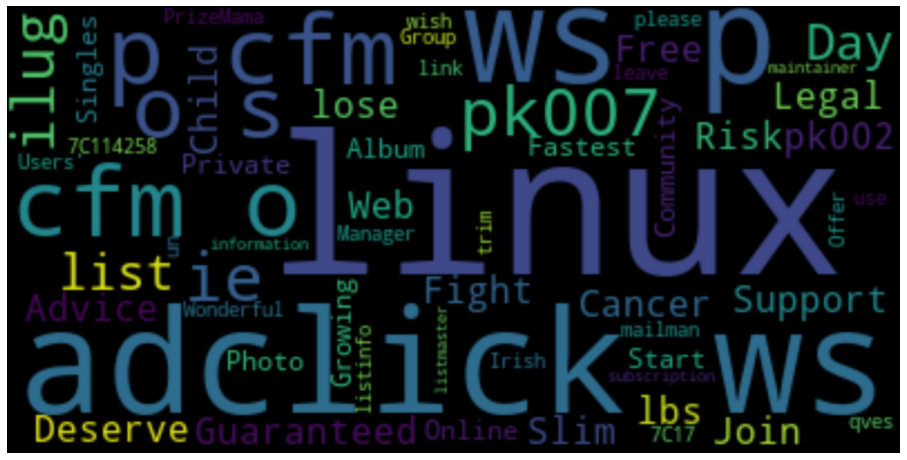

In [50]:
word_cloud = WordCloud().generate(emails.at[1,'MESSAGE'])
plt.figure(figsize=(16,10))
plt.imshow(word_cloud, interpolation='gaussian')
plt.axis('off')
plt.show()

In [51]:
example_corpus = nltk.corpus.gutenberg.words('melville-moby_dick.txt')
len(example_corpus)
type(example_corpus)

nltk.corpus.reader.util.StreamBackedCorpusView

In [52]:
example_corpus

['[', 'Moby', 'Dick', 'by', 'Herman', 'Melville', ...]

In [53]:
word_list = [''.join(w) for w in example_corpus]
novel_as_string = ' '.join(word_list)

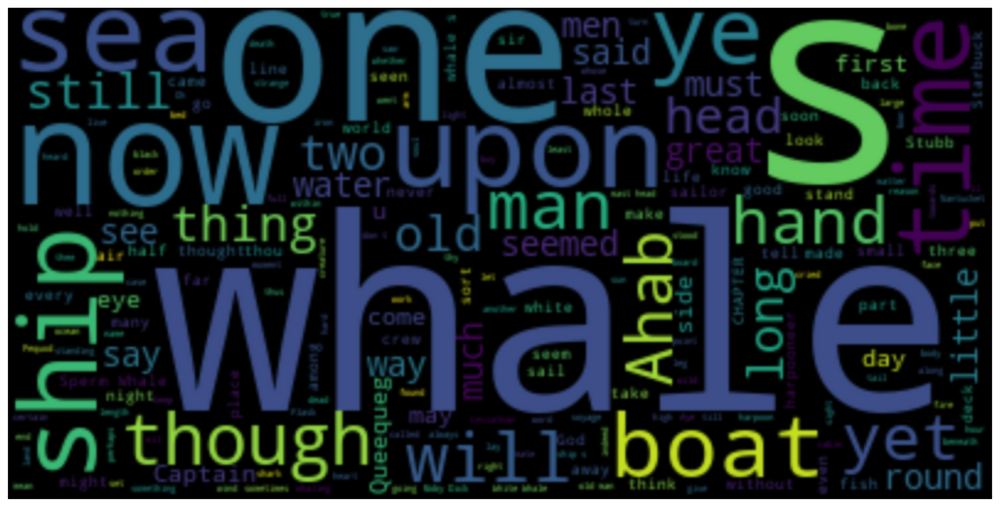

In [54]:
word_cloud = WordCloud().generate(novel_as_string)
plt.figure(figsize=(16,10), dpi=500)
plt.imshow(word_cloud, interpolation='gaussian')
plt.axis('off')
plt.show()

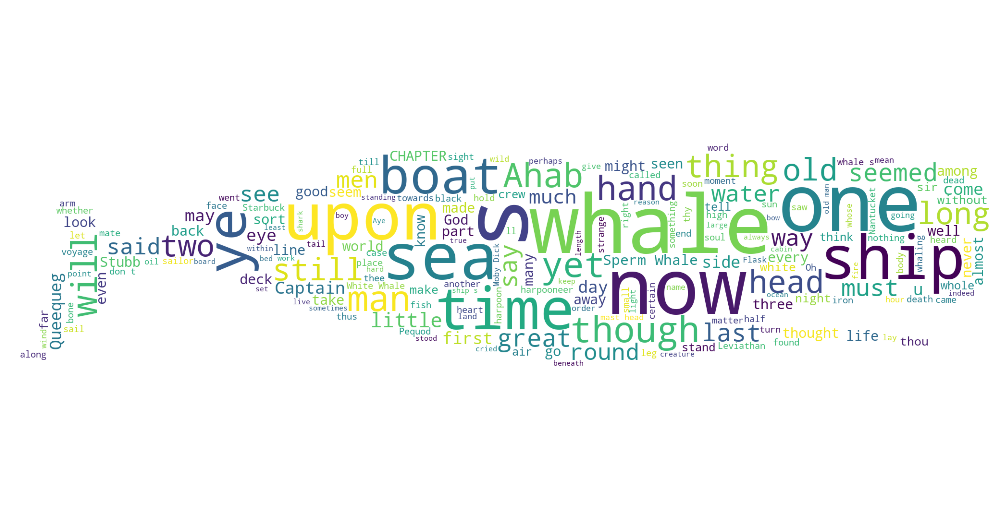

In [55]:
icon = Image.open(WHALE_IM)
image_mask = Image.new(mode='RGB', size=icon.size, color=(255,255,255))
image_mask.paste(icon,box=icon)

#convert image to rgb array
rgb_array = np.array(image_mask)

word_cloud = WordCloud(mask=rgb_array, background_color='white').generate(novel_as_string)
plt.figure(figsize=(16,10), dpi=500)
plt.imshow(word_cloud, interpolation='bilinear')
plt.axis('off')
plt.show()

## Word Cloud for Spam & Ham mails

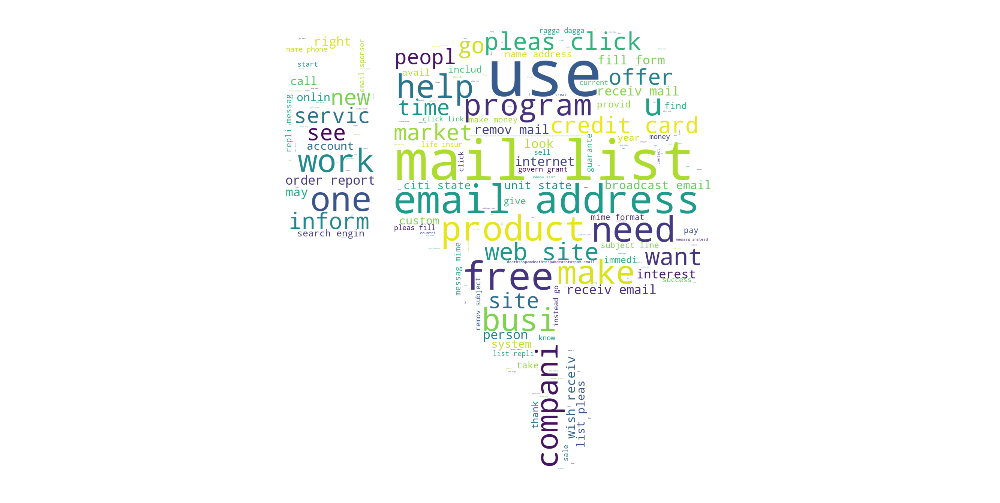

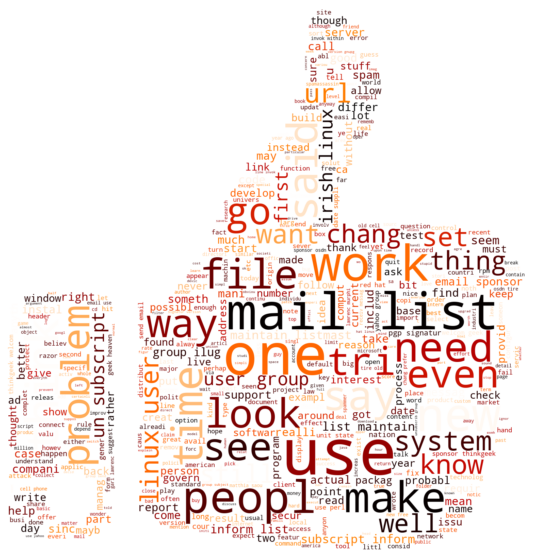

In [56]:
icon = Image.open(THUMB_DOWN)
image_mask = Image.new(mode='RGB', size=icon.size, color=(255,255,255))
image_mask.paste(icon,box=icon)

#convert image to rgb array
rgb_array = np.array(image_mask)

spam_string = ' '.join(flat_spam)

word_cloud = WordCloud(mask=rgb_array, background_color='white').generate(spam_string)
plt.figure(figsize=(16,10), dpi=500)
plt.imshow(word_cloud, interpolation='bilinear')
plt.axis('off')
plt.show()


icon = Image.open(THUMB_UP)
image_mask = Image.new(mode='RGB', size=icon.size, color=(255,255,255))
image_mask.paste(icon,box=icon)

#convert image to rgb array
rgb_array = np.array(image_mask)

ham_string = ' '.join(flat_ham)

word_cloud = WordCloud(mask=rgb_array, background_color='white', colormap='gist_heat', max_words=500).generate(ham_string)
plt.figure(figsize=(16,10))
plt.imshow(word_cloud, interpolation='bilinear')
plt.axis('off')
plt.show()

# Generate Vocabulary and Disctionary

In [57]:
# create list of words in email bodies
stemword_list_emails = emails.MESSAGE.apply(clean_email_body)
flat_stemword_list_email = [item for sublist in stemword_list_emails for item in sublist]

D:\anaconda\lib\site-packages\bs4\__init__.py:417: MarkupResemblesLocatorWarning: "http://www.post-gazette.com/columnists/20020905brian5
" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  warnings.warn(


In [58]:
# create unique word list
unique_word_emails = pd.Series(flat_stemword_list_email).value_counts()
print('Num of unique words ', unique_word_emails.shape[0])

# take most frequently used 2500 words
most_used_words = unique_word_emails[:2500]
most_used_words

Num of unique words  27334


http          10660
use            5019
list           4851
email          4367
get            4200
              ...  
contest          44
difficulti       43
inch             43
manner           43
fake             43
Length: 2500, dtype: int64

## Create vocabulary dataframe with word_list

In [59]:
word_index = list(range(0,VOCAB_SIZE))
vocab = pd.DataFrame({'VOCAB_WORD':most_used_words.index.values} , index=word_index)
vocab.index.name = 'Word_id'
vocab.VOCAB_WORD.name
vocab

,VOCAB_WORD
Word_id,
0,http
1,use
2,list
3,email
4,get
...,...
2495,contest
2496,difficulti
2497,inch


## Save vocabulary to machine as csv file

In [60]:
vocab.to_csv(WORD_FILE, index_label=vocab.index.name, header=vocab.VOCAB_WORD.name)

## check a word in the vocab

In [61]:
'http' in set(vocab.VOCAB_WORD)

True

## Find longest email

In [62]:
nested_email_list_with_stemmedword = emails.MESSAGE.apply(clean_email_body)

D:\anaconda\lib\site-packages\bs4\__init__.py:417: MarkupResemblesLocatorWarning: "http://www.post-gazette.com/columnists/20020905brian5
" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  warnings.warn(


In [63]:
nested_email_list_with_stemmedword

DOC_ID
0       [save, life, insur, spend, life, quot, save, g...
1       [fight, risk, cancer, http, slim, guarante, lo...
2       [fight, risk, cancer, http, slim, guarante, lo...
3       [adult, club, offer, free, membership, instant...
4       [thought, might, like, slim, guarante, lose, l...
                              ...                        
5791    [http, bizarr, collect, stuf, anim, could, fet...
5792    [care, use, one, also, realli, cute, thing, ja...
5793    [sm, skip, montanaro, write, jeremi, put, anot...
5794    [mark, hammond, like, given, zodb, sound, attr...
5795    [hi, probabl, use, whatsoev, also, problem, re...
Name: MESSAGE, Length: 5796, dtype: object

In [64]:
length_emails = [len(sublists) for sublists in nested_email_list_with_stemmedword]
print(max(length_emails))

index_of_maxlen_email = length_emails.index(max(length_emails))

# len(nested_email_list_with_stemmedword[index_of_maxlen_email])

index_of_maxlen_email1 = np.argmax(length_emails)
index_of_maxlen_email1

7671


5775

### Create dataframe using stemword list and create train,test data

In [65]:
type(nested_email_list_with_stemmedword)

pandas.core.series.Series

In [66]:
stem_word_df = pd.DataFrame.from_records(nested_email_list_with_stemmedword)
stem_word_df

,0,1,2,3,4,5,6,7,8,9,...,7661,7662,7663,7664,7665,7666,7667,7668,7669,7670
0,save,life,insur,spend,life,quot,save,g,famili,financi,...,None,None,None,None,None,None,None,None,None,None
1,fight,risk,cancer,http,slim,guarante,lose,lb,day,http,...,None,None,None,None,None,None,None,None,None,None
2,fight,risk,cancer,http,slim,guarante,lose,lb,day,http,...,None,None,None,None,None,None,None,None,None,None
3,adult,club,offer,free,membership,instant,access,site,user,name,...,None,None,None,None,None,None,None,None,None,None
4,thought,might,like,slim,guarante,lose,lb,day,http,fight,...,None,None,None,None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5791,http,bizarr,collect,stuf,anim,could,fetch,sold,cornwal,museum,...,None,None,None,None,None,None,None,None,None,None
5792,care,use,one,also,realli,cute,thing,japanes,av,girl,...,None,None,None,None,None,None,None,None,None,None
5793,sm,skip,montanaro,write,jeremi,put,anoth,way,interest,hear,...,None,None,None,None,None,None,None,None,None,None
5794,mark,hammond,like,given,zodb,sound,attract,would,packag,hundr,...,None,None,None,None,None,None,None,None,None,None


In [67]:
X_train , X_test , y_train , y_test = train_test_split(stem_word_df, emails.CATEGORY,test_size=0.3,random_state=42)

In [68]:
X_train.index.name = X_test.index.name = 'DOC_ID'
X_train

,0,1,2,3,4,5,6,7,8,9,...,7661,7662,7663,7664,7665,7666,7667,7668,7669,7670
DOC_ID,,,,,,,,,,,,,,,,,,,,,
4844,ye,inde,agent,directori,verita,cd,unix,subdirectori,file,call,...,None,None,None,None,None,None,None,None,None,None
4727,problem,come,tri,instal,harddissssk,like,alreadi,mount,http,yahoo,...,None,None,None,None,None,None,None,None,None,None
5022,origin,messag,date,mon,aug,chad,norwood,sven,cc,subject,...,None,None,None,None,None,None,None,None,None,None
3504,inlin,folk,sever,major,internet,outag,morn,across,major,provid,...,None,None,None,None,None,None,None,None,None,None
3921,url,http,date,bath,chronicl,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3772,url,http,date,tue,sep,gmt,wire,urgent,busi,proposit,...,None,None,None,None,None,None,None,None,None,None
5191,wander,uppsala,sweden,last,week,ran,across,keramik,studio,paula,...,None,None,None,None,None,None,None,None,None,None
5226,pm,win,trees,wrote,actual,easi,test,experiment,compar,result,...,None,None,None,None,None,None,None,None,None,None


In [69]:
y_train.at[4727]

0

In [70]:
vocab.VOCAB_WORD[395]

print(y_train)

DOC_ID
4844    0
4727    0
5022    0
3504    0
3921    0
       ..
3772    0
5191    0
5226    0
5390    0
860     1
Name: CATEGORY, Length: 4057, dtype: int64


### Create a Sparse Matrix for the Training Data

In [71]:
word_index = pd.Index(vocab.VOCAB_WORD)
word_index.get_loc('term')
# print(vocab.VOCAB_WORD[1])
# print(word_index.get_loc("use"))

395

In [72]:
def make_sparse_matrix(df, indexed_words, labels):
    """
    Returns sparse matrix as dataframe.
    
    df: A dataframe with words in the columns with a document id as an index (X_train or X_test)
    indexed_words: index of words ordered by word id
    labels: category as a series (y_train or y_test)
    """
    
    nr_rows = df.shape[0]
    nr_cols = df.shape[1]
    word_set = set(indexed_words)
    dict_list = []
    
    for i in range(nr_rows):
        for j in range(nr_cols):
            
            word = df.iat[i, j]
            if word in word_set:
                doc_id = df.index[i]
                word_id = indexed_words.get_loc(word)
                category = labels.at[doc_id]
                
                item = {'LABEL': category, 'DOC_ID': doc_id,
                       'OCCURENCE': 1, 'WORD_ID': word_id}
                
                dict_list.append(item)
    
    return pd.DataFrame(dict_list)

In [73]:
sparse_train_df = make_sparse_matrix(X_train, word_index, y_train)
sparse_train_df

,LABEL,DOC_ID,OCCURENCE,WORD_ID
0,0,4844,1,265
1,0,4844,1,1236
2,0,4844,1,502
3,0,4844,1,308
4,0,4844,1,254
...,...,...,...,...
429241,1,860,1,47
429242,1,860,1,1431
429243,1,860,1,26
429244,1,860,1,21


In [74]:
### Combine Occurences with the Pandas groupby() Method ###

In [75]:
train_grouped = sparse_train_df.groupby(["DOC_ID","WORD_ID","LABEL"]).sum()
train_grouped

OCCURENCE
DOC_ID WORD_ID LABEL           
0      2       1              1
       3       1              2
       4       1              1
       7       1              3
       11      1              1
...                         ...
5795   2036    0              1
       2040    0              2
       2271    0              1
       2345    0              1
       2363    0              1

[258378 rows x 1 columns]

In [76]:
train_grouped = train_grouped.reset_index()
train_grouped

,DOC_ID,WORD_ID,LABEL,OCCURENCE
0,0,2,1,1
1,0,3,1,2
2,0,4,1,1
3,0,7,1,3
4,0,11,1,1
...,...,...,...,...
258373,5795,2036,0,1
258374,5795,2040,0,2
258375,5795,2271,0,1
258376,5795,2345,0,1


In [77]:
### Save Training as .txt file ###

In [78]:
np.savetxt("train_data.txt",train_grouped,fmt='%d')

In [80]:
sparse_test_df = make_sparse_matrix(X_test, word_index, y_test)
test_grouped = sparse_test_df.groupby(["DOC_ID","WORD_ID","LABEL"]).sum()
test_grouped = test_grouped.reset_index()
np.savetxt("test_data.txt",test_grouped,fmt='%d')